In [1]:
%matplotlib inline
from __future__ import print_function
import matplotlib.pyplot as plt
import numpy as np
import cv2
import pylab 


# import numpy as np
import argparse
# import cv2
 

In [2]:
%pylab inline
pylab.rcParams['figure.figsize'] = (20, 10)

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


In [3]:
!ls ../Data/

1137_1.jpg          2012110600019_a.JPG 2013121007220_a.JPG 2014100200922_a.JPG
20090620010082.JPG  2012110600023_a.JPG 2013121007234_a.JPG 2014100203568_a.JPG
20090620024112.JPG  2012110600030_a.JPG 2014022407941_a.jpg 2014100203572_a.JPG
20090620032130.JPG  2012110600031_a.JPG 2014022702228_a.JPG 2015042000136_a.JPG
20090623021864.JPG  2012110600043_a.JPG 2014100200075_a.JPG 2015042000141_a.JPG
20090624014861.JPG  2013110800227.JPG   2014100200081_a.JPG 2015042000144_a.JPG
20090626012660.JPG  2013110800237.JPG   2014100200084_a.JPG 2015042000151_a.JPG
20090626016912.JPG  2013121006944_a.JPG 2014100200093_a.JPG IMG_0420.JPG
2012110600016_a.JPG 2013121006981_a.JPG 2014100200099_a.JPG IMG_8756.JPG


In [4]:
img = cv2.imread('../Data/20090620010082.JPG',0)

In [5]:
img

array([[116, 107,  94, ...,  71,  75,  80],
       [114, 111, 102, ...,  78,  81,  85],
       [114, 114, 111, ...,  85,  89,  92],
       ..., 
       [ 25,  24,  25, ...,  31,  31,  32],
       [ 25,  25,  26, ...,  31,  32,  34],
       [ 25,  26,  27, ...,  30,  32,  34]], dtype=uint8)

In [6]:
# cv2.imshow('image',img)
# cv2.waitKey(0)
# plt.show()
# # cv2.destroyAllWindows()

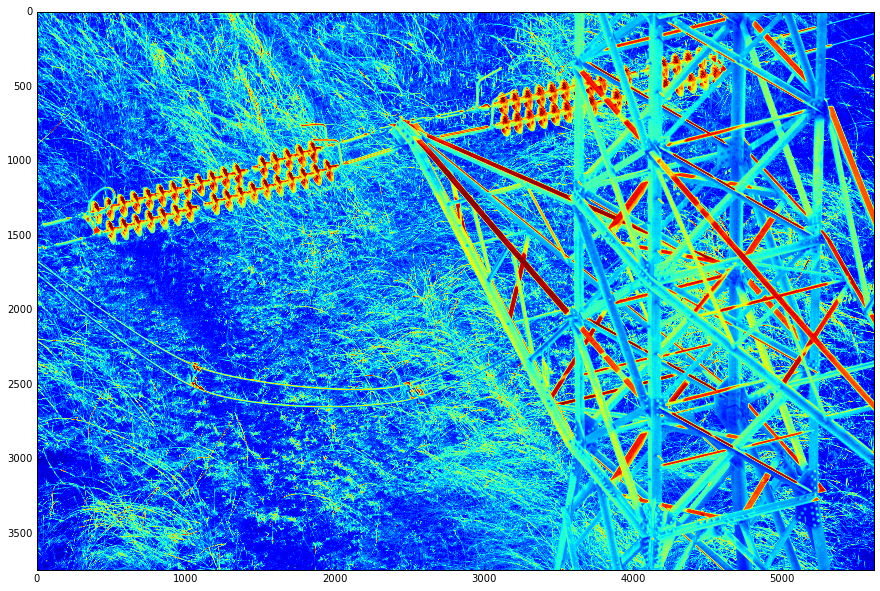

In [7]:
plt.imshow(img)
plt.show()

In [8]:
img.shape

(3744, 5616)

In [9]:
BGRflags = [flag for flag in dir(cv2) if flag.startswith('COLOR_BGR') ]

In [10]:

def adjust_gamma(image, gamma=1.0):
	# build a lookup table mapping the pixel values [0, 255] to
	# their adjusted gamma values
	invGamma = 1.0 / gamma
	table = np.array([((i / 255.0) ** invGamma) * 255
		for i in np.arange(0, 256)]).astype("uint8")
 
	# apply gamma correction using the lookup table
	return cv2.LUT(image, table)

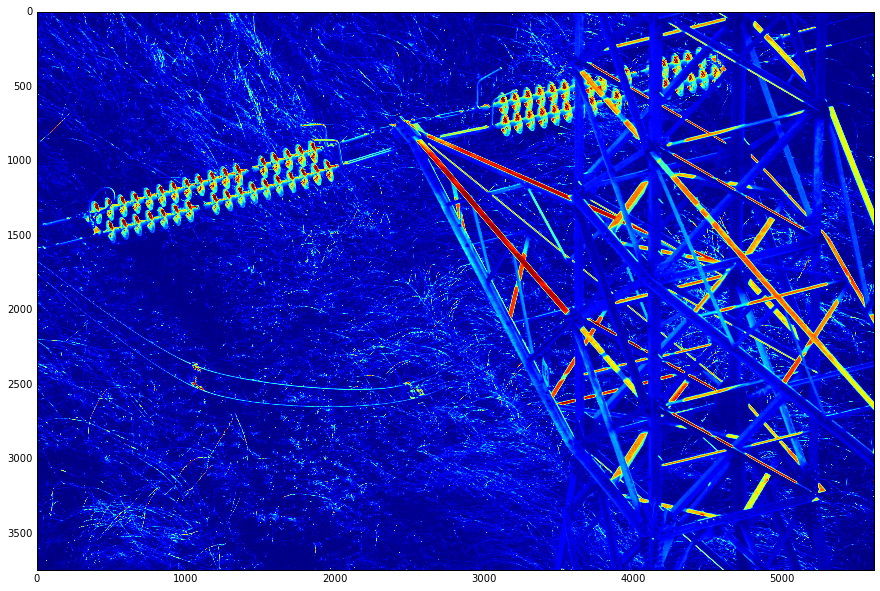

In [11]:
plt.imshow(adjust_gamma(img, 0.4))

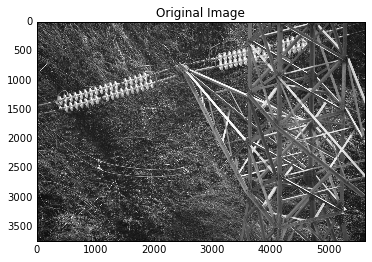

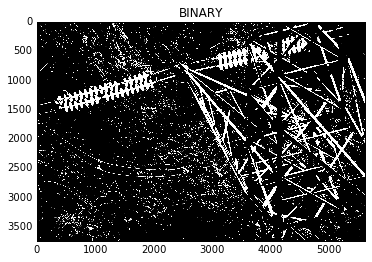

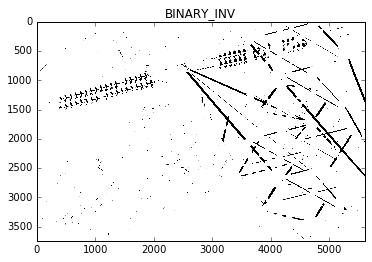

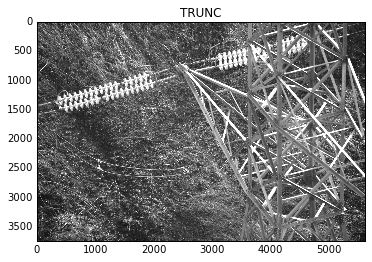

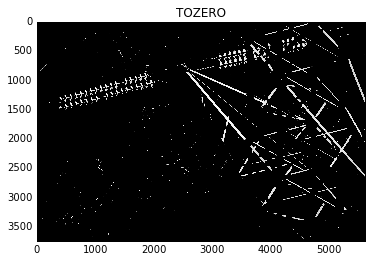

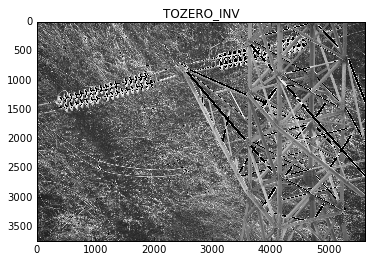

In [12]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# img = cv2.imread('gradient.png',0)
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img,200,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img,200,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img,200,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img,200,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
 
for i in xrange(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.show()

In [13]:
# src.create(rows, cols, CV_8UC1);
# src = imread("../Data/20090620010082.JPG", CV_8UC1);

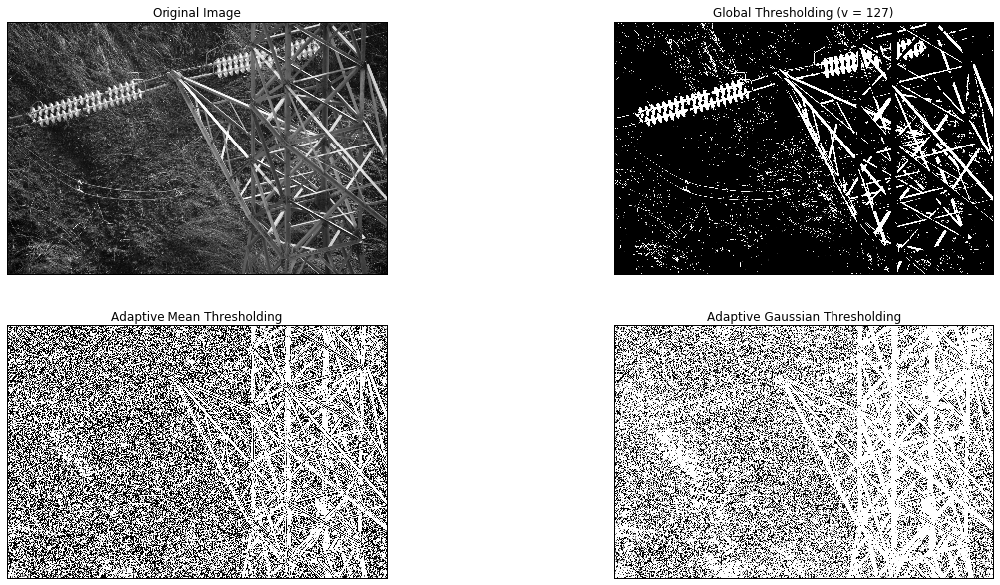

In [14]:

# img = cv2.imread('dave.jpg',0)
img = cv2.medianBlur(img,5)
ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)

titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
 
for i in xrange(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()


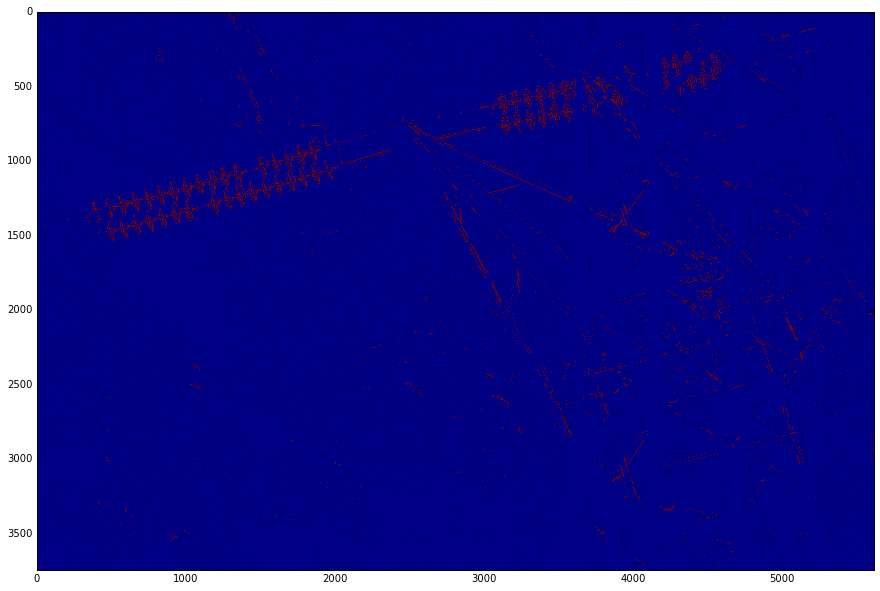

In [16]:
plt.imshow(images[1] - 2*images[2])

In [19]:
new_img = images[1] - 2*images[2]
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
erosion = cv2.erode(img,kernel,iterations = 1)

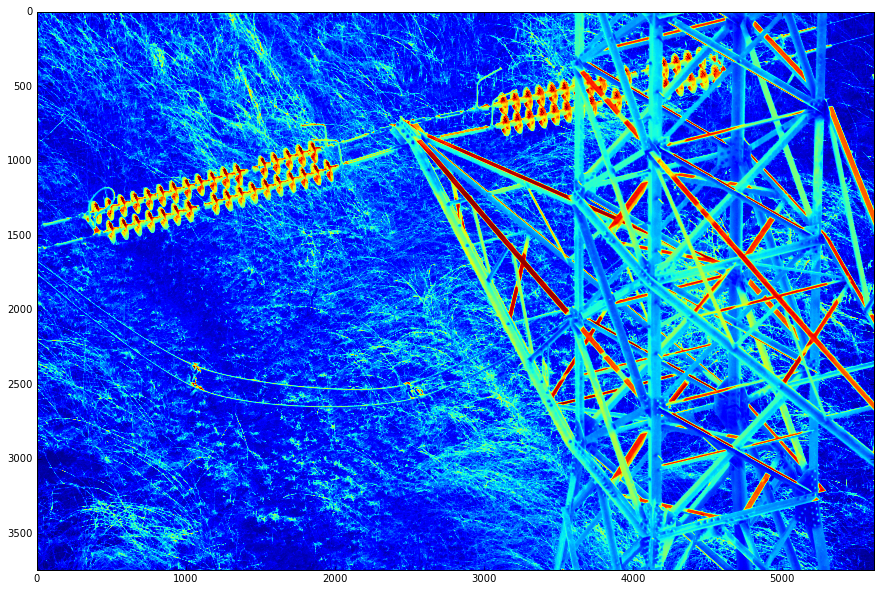

In [20]:
plt.imshow(erosion)

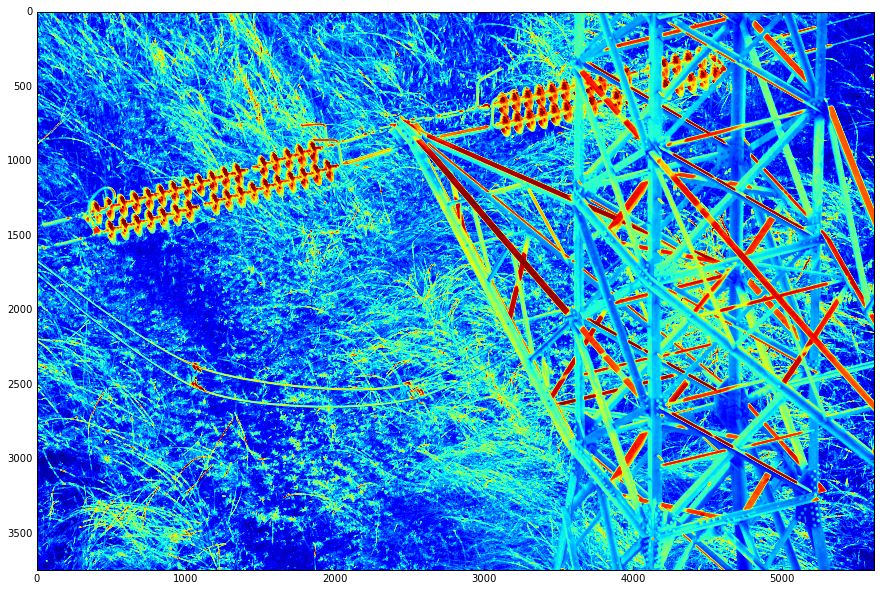

In [21]:
dilation = cv2.dilate(img,kernel,iterations = 1)
plt.imshow(dilation)

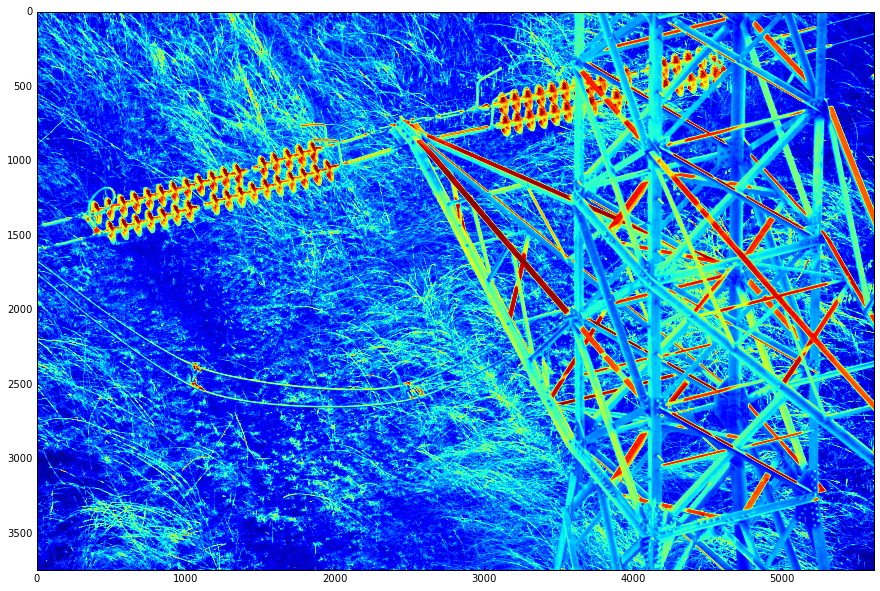

In [18]:
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
plt.imshow(opening)

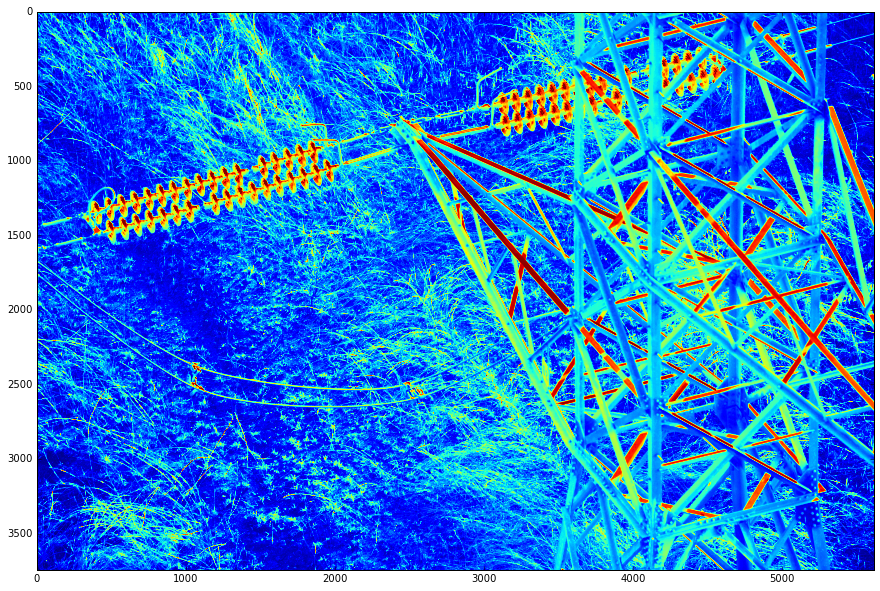

In [19]:
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
plt.imshow(closing)

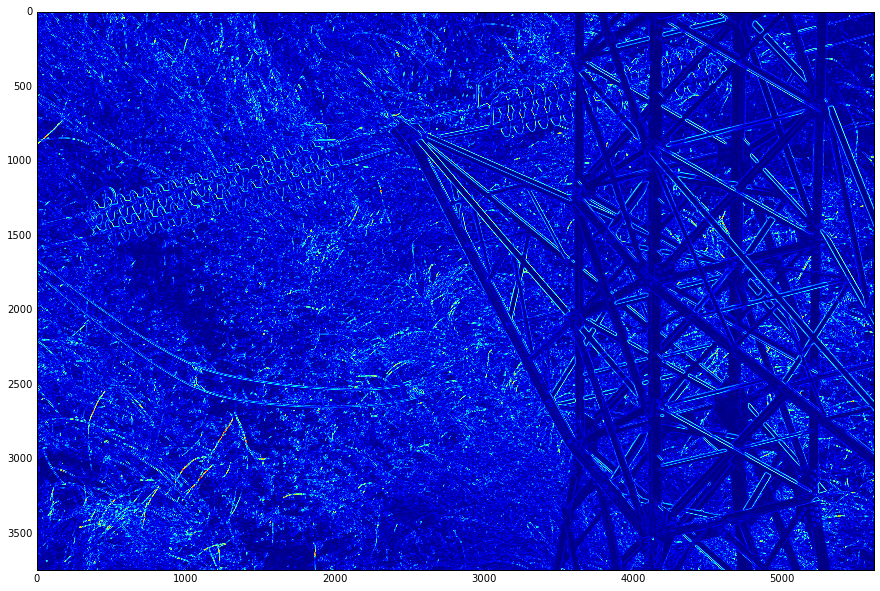

In [20]:
gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
plt.imshow(gradient)

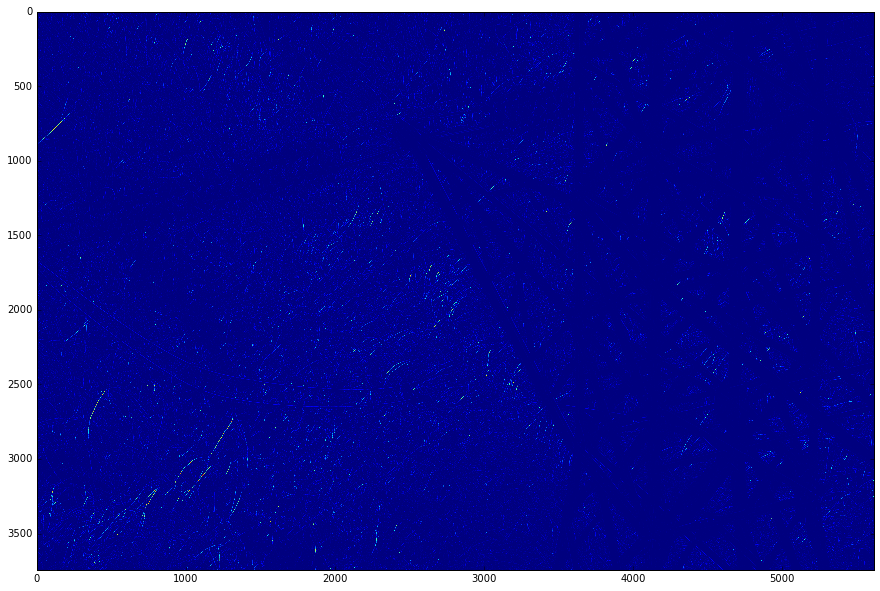

In [21]:
tophat = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)
plt.imshow(tophat)

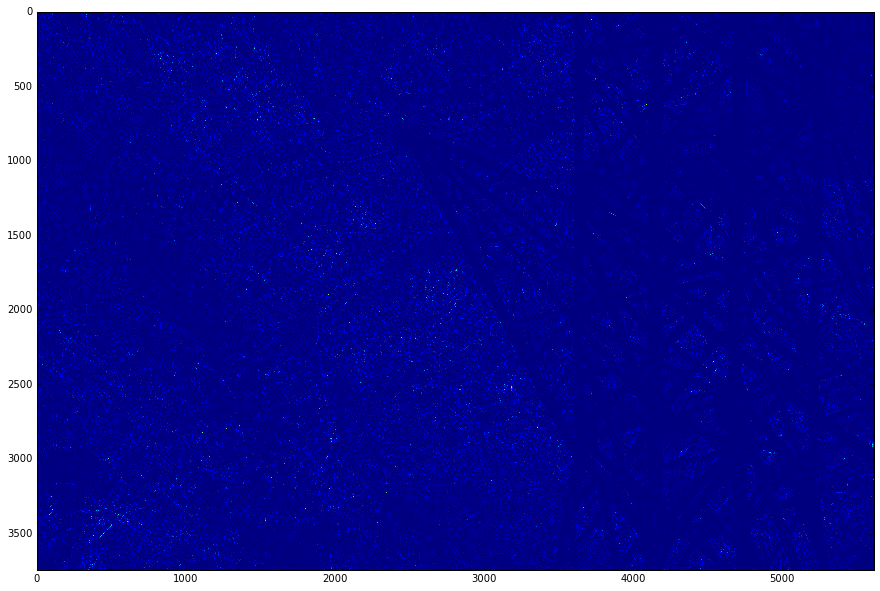

In [22]:
blackhat = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)
plt.imshow(blackhat)

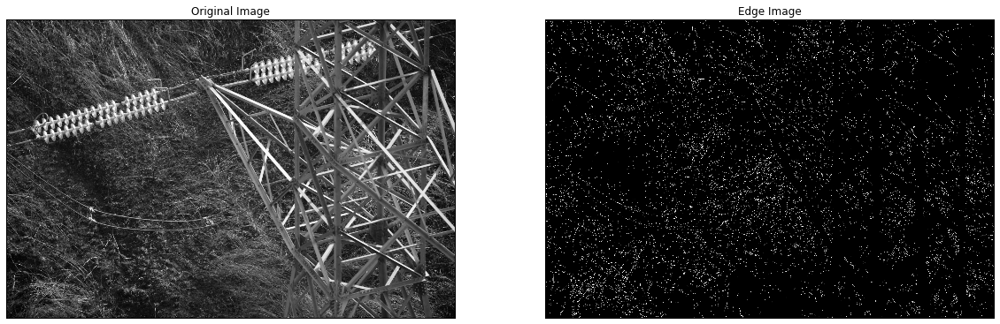

In [23]:
edges = cv2.Canny(img,100,200)

plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show() 

In [ ]:
img = cv2.medianBlur(img,5)
cimg = cv2.cvtColor(img,cv2.COLOR_GRAY2BGR)

circles = cv2.HoughCircles(img,cv2.cv.CV_HOUGH_GRADIENT,1,20,
                            param1=50,param2=30,minRadius=0,maxRadius=0)

circles = np.uint16(np.around(circles))
for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)
    # draw the center of the circle
    cv2.circle(cimg,(i[0],i[1]),2,(0,0,255),3)

# cv2.imshow('detected circles',cimg)
# cv2.waitKey(0)
# cv2.destroyAllWindows()
plt.imshow(cimg)

In [23]:
# gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(gray,None)
img1=cv2.drawKeypoints(img,kp,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(im1)

AttributeError: 'module' object has no attribute 'xfeatures2d'